In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/celebahq/celeba_hq/val/female/102631.jpg
/kaggle/input/celebahq/celeba_hq/val/female/010011.jpg
/kaggle/input/celebahq/celeba_hq/val/female/050406.jpg
/kaggle/input/celebahq/celeba_hq/val/female/101276.jpg
/kaggle/input/celebahq/celeba_hq/val/female/083281.jpg
/kaggle/input/celebahq/celeba_hq/val/female/078234.jpg
/kaggle/input/celebahq/celeba_hq/val/female/115305.jpg
/kaggle/input/celebahq/celeba_hq/val/female/060226.jpg
/kaggle/input/celebahq/celeba_hq/val/female/199651.jpg
/kaggle/input/celebahq/celeba_hq/val/female/099685.jpg
/kaggle/input/celebahq/celeba_hq/val/female/092323.jpg
/kaggle/input/celebahq/celeba_hq/val/female/046333.jpg
/kaggle/input/celebahq/celeba_hq/val/female/198844.jpg
/kaggle/input/celebahq/celeba_hq/val/female/069690.jpg
/kaggle/input/celebahq/celeba_hq/val/female/044235.jpg
/kaggle/input/celebahq/celeba_hq/val/female/169265.jpg
/kaggle/input/celebahq/celeba_hq/val/female/126747.jpg
/kaggle/input/celebahq/celeba_hq/val/female/080133.jpg
/kaggle/in

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from math import log2

In [3]:
factors = [1,1,1,1, 1/2, 1/4, 1/8, 1/16, 1/32]

# Weighted Scaled Conv Layer

In [4]:
class WSConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size = 3, stride = 1, padding = 1, gain = 2):
        super(WSConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.scale = (gain/(in_channels * kernel_size**2))**0.5
        self.bias = self.conv.bias
        self.conv.bias = None
        
        # initialize conv layer
        nn.init.normal_(self.conv.weight)
        nn.init.zeros_(self.bias)
        
    def forward(self, x):
        return self.conv(x*self.scale) + self.bias.view(1, self.bias.shape[0], 1, 1)
        

# Pixel Normalization

In [5]:
class PixelNorm(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.epsilon = 1e-8
        
    def forward(self, x):
        return x / torch.sqrt(torch.mean(x**2, dim = 1, keepdim = True) + self.epsilon)

# Convolutional Block

In [6]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel = 3, stride = 1, padding = 1, use_pixelnorm = True):
        super().__init__()
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2)
        self.pn = PixelNorm()
        self.use_pn = use_pixelnorm
        
    def forward(self, x):
        x = self.leaky(self.conv1(x))
        x = self.pn(x) if self.use_pn else x
        x = self.leaky(self.conv2(x))
        x = self.pn(x) if self.use_pn else x
        
        return x
        

# Generator

In [7]:
class Generator(nn.Module):
    def __init__(self, z_dim, in_channels, img_channel = 3):
        super().__init__()
        self.initial = nn.Sequential(
            PixelNorm(),
            nn.ConvTranspose2d(z_dim, in_channels, 4, 1, 0), # 1x1 -> 4x4
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size = 3, stride = 1, padding = 1),
            nn.LeakyReLU(0.2),
            PixelNorm()
        )
        
        self.initial_rgb = WSConv2d(in_channels, img_channel, kernel_size = 1, stride = 1, padding = 0)
        self.prop_blocks, self.rgb_layers = nn.ModuleList([]), nn.ModuleList([self.initial_rgb])
        
        
        for i in range(len(factors) - 1):
            
            conv_in_c = int(in_channels * factors[i])
            conv_out_c = int(in_channels * factors[i+1])
            self.prop_blocks.append(ConvBlock(conv_in_c, conv_out_c))
            self.rgb_layers.append(WSConv2d(conv_out_c, img_channel, kernel_size = 1, stride = 1, padding = 0))
            
        
        
    def fade_in(self, alpha, upscaled, generated):
        return torch.tanh(alpha * generated + (1-alpha)* upscaled)
    
    def forward(self, x, alpha, steps):
        out = self.initial(x) # 4x4
        if steps == 0:
            return self.initial_rgb(out)
        for step in range(steps):
            upscaled = F.interpolate(out, scale_factor = 2, mode = "nearest")
            out = self.prop_blocks[step](upscaled)
            
        final_upscaled = self.rgb_layers[steps - 1](upscaled)
        final_out = self.rgb_layers[steps](out)
        
        return self.fade_in(alpha, final_upscaled, final_out)
            
            

In [8]:
class Discriminator(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Discriminator, self).__init__()
        self.prog_blocks, self.rgb_layers = nn.ModuleList([]), nn.ModuleList([])
        self.leaky = nn.LeakyReLU(0.2)

        for i in range(len(factors) - 1, 0, -1):
            conv_in = int(in_channels * factors[i])
            conv_out = int(in_channels * factors[i - 1])
            self.prog_blocks.append(ConvBlock(conv_in, conv_out, use_pixelnorm=False))
            self.rgb_layers.append(
                WSConv2d(img_channels, conv_in, kernel_size=1, stride=1, padding=0)
            )

        self.initial_rgb = WSConv2d(
            img_channels, in_channels, kernel_size=1, stride=1, padding=0
        )
        self.rgb_layers.append(self.initial_rgb)
        self.avg_pool = nn.AvgPool2d(
            kernel_size=2, stride=2
        )  # down sampling using avg pool

        # this is the block for 4x4 input size
        self.final_block = nn.Sequential(
            # +1 to in_channels because we concatenate from MiniBatch std
            WSConv2d(in_channels + 1, in_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=4, padding=0, stride=1),
            nn.LeakyReLU(0.2),
            WSConv2d(
                in_channels, 1, kernel_size=1, padding=0, stride=1
            ),  # we use this instead of linear layer
        )

    def fade_in(self, alpha, downscaled, out):
        return alpha * out + (1 - alpha) * downscaled

    def minibatch_std(self, x):
        batch_statistics = (
            torch.std(x, dim=0).mean().repeat(x.shape[0], 1, x.shape[2], x.shape[3])
        )
        
        return torch.cat([x, batch_statistics], dim=1)

    def forward(self, x, alpha, steps):
   
        cur_step = len(self.prog_blocks) - steps

        out = self.leaky(self.rgb_layers[cur_step](x))

        if steps == 0:  # i.e, image is 4x4
            out = self.minibatch_std(out)
            return self.final_block(out).view(out.shape[0], -1)

        downscaled = self.leaky(self.rgb_layers[cur_step + 1](self.avg_pool(x)))
        out = self.avg_pool(self.prog_blocks[cur_step](out))
        out = self.fade_in(alpha, downscaled, out)

        for step in range(cur_step + 1, len(self.prog_blocks)):
            out = self.prog_blocks[step](out)
            out = self.avg_pool(out)

        out = self.minibatch_std(out)
        return self.final_block(out).view(out.shape[0], -1)

# Testing

In [9]:
# if __name__ == "__main__":
Z_DIM = 100
IN_CHANNELS = 256
gen = Generator(Z_DIM, IN_CHANNELS, img_channel=3)
critic = Discriminator(Z_DIM, IN_CHANNELS, img_channels=3)

for img_size in [4, 8, 16, 32, 64, 128, 256, 512, 1024]:
    num_steps = int(log2(img_size / 4))
    x = torch.randn((1, Z_DIM, 1, 1))
    z = gen(x, 0.5, steps=num_steps)
    assert z.shape == (1, 3, img_size, img_size)
    out = critic(z, alpha=0.5, steps=num_steps)
    assert out.shape == (1, 1)
    print(f"Success! At img size: {img_size}")

Success! At img size: 4
Success! At img size: 8
Success! At img size: 16
Success! At img size: 32
Success! At img size: 64
Success! At img size: 128
Success! At img size: 256
Success! At img size: 512
Success! At img size: 1024


# Configs

In [10]:
START_TRAIN_AT_IMG_SIZE = 128
DATASET = '/kaggle/input/celebahq/celeba_hq'
CHECKPOINT_GEN = "/kaggle/working/generator.pth"
CHECKPOINT_CRITIC = "/kaggle/working/critic.pth"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
SAVE_MODEL = True
LOAD_MODEL = False
LEARNING_RATE = 1e-3
BATCH_SIZES = [32, 32, 32, 16, 16, 16, 16, 8, 4]
CHANNELS_IMG = 3
Z_DIM = 256  # should be 512 in original paper
IN_CHANNELS = 256  # should be 512 in original paper
CRITIC_ITERATIONS = 1
LAMBDA_GP = 10
PROGRESSIVE_EPOCHS = [30] * len(BATCH_SIZES)
FIXED_NOISE = torch.randn(8, Z_DIM, 1, 1).to(DEVICE)
NUM_WORKERS = 4

In [11]:
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
import os
import torchvision
from torchvision.utils import save_image
from scipy.stats import truncnorm

In [12]:
def save_checkpoint(model, optimizer, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)

In [13]:
def load_checkpoint(checkpoint_file, model, optimizer, lr):
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location="cuda")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    # If we don't do this then it will just have learning rate of old checkpoint
    # and it will lead to many hours of debugging \:
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr

In [14]:
def gradient_penalty(critic, real, fake, alpha, train_step, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    beta = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * beta + fake.detach() * (1 - beta)
    interpolated_images.requires_grad_(True)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images, alpha, train_step)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty


In [15]:
def get_loader(image_size):
    transform = transforms.Compose(
        [
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.Normalize(
                [0.5 for _ in range(CHANNELS_IMG)],
                [0.5 for _ in range(CHANNELS_IMG)],
            ),
        ]
    )
    batch_size = BATCH_SIZES[int(log2(image_size / 4))]
    dataset = datasets.ImageFolder(root=DATASET, transform=transform)
    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
    )
    return loader, dataset


In [16]:
import matplotlib.pyplot as plt

In [17]:
def train_fn(
    critic,
    gen,
    loader,
    dataset,
    step,
    alpha,
    opt_critic,
    opt_gen,
    scaler_gen,
    scaler_critic,
):
    loop = tqdm(loader, leave=True)
    for batch_idx, (real, _) in enumerate(loop):
        real = real.to(DEVICE)
        cur_batch_size = real.shape[0]

        # Train Critic: max E[critic(real)] - E[critic(fake)] <-> min -E[critic(real)] + E[critic(fake)]
        # which is equivalent to minimizing the negative of the expression
        noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(DEVICE)

        with torch.cuda.amp.autocast():
            fake = gen(noise, alpha, step)
            critic_real = critic(real, alpha, step)
            critic_fake = critic(fake.detach(), alpha, step)
            gp = gradient_penalty(critic, real, fake, alpha, step, device=DEVICE)
            loss_critic = (
                -(torch.mean(critic_real) - torch.mean(critic_fake))
                + LAMBDA_GP * gp
                + (0.001 * torch.mean(critic_real ** 2))
            )

        opt_critic.zero_grad()
        scaler_critic.scale(loss_critic).backward()
        scaler_critic.step(opt_critic)
        scaler_critic.update()

        # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        with torch.cuda.amp.autocast():
            gen_fake = critic(fake, alpha, step)
            loss_gen = -torch.mean(gen_fake)

        opt_gen.zero_grad()
        scaler_gen.scale(loss_gen).backward()
        scaler_gen.step(opt_gen)
        scaler_gen.update()

        # Update alpha and ensure less than 1
        alpha += cur_batch_size / (
            (PROGRESSIVE_EPOCHS[step] * 0.5) * len(dataset)
        )
        alpha = min(alpha, 1)

        if batch_idx % 500 == 0:
            with torch.no_grad():
                fixed_fakes = gen(FIXED_NOISE, alpha, step) * 0.5 + 0.5
                img_grid_fake = torchvision.utils.make_grid(fixed_fakes[:8], normalize=True)
                plt.imshow(img_grid_fake.cpu().detach().reshape(132, 1042, 3))
                plt.show()

        loop.set_postfix(
            gp=gp.item(),
            loss_critic=loss_critic.item(),
        )

    return alpha

In [18]:
def main():
    gen = Generator(Z_DIM, IN_CHANNELS, img_channel=CHANNELS_IMG).to(DEVICE)
    critic = Discriminator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)

    # initialize optimizers and scalers for FP16 training
    opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
    opt_critic = optim.Adam(
        critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99)
    )
    scaler_critic = torch.cuda.amp.GradScaler()
    scaler_gen = torch.cuda.amp.GradScaler()

    if LOAD_MODEL:
        load_checkpoint(
            CHECKPOINT_GEN, gen, opt_gen, LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_CRITIC, critic, opt_critic, LEARNING_RATE,
        )

    gen.train()
    critic.train()

    # start at step that corresponds to img size that we set in config
    step = int(log2(START_TRAIN_AT_IMG_SIZE / 4))
    for num_epochs in PROGRESSIVE_EPOCHS[step:]:
        alpha = 1e-5  # start with very low alpha
        loader, dataset = get_loader(4 * 2 ** step)  # 4->0, 8->1, 16->2, 32->3, 64 -> 4
        print(f"Current image size: {4 * 2 ** step}")

        for epoch in range(num_epochs):
            print(f"Epoch [{epoch+1}/{num_epochs}]")
            alpha = train_fn(
                critic,
                gen,
                loader,
                dataset,
                step,
                alpha,
                opt_critic,
                opt_gen,
                scaler_gen,
                scaler_critic,
            )

            if SAVE_MODEL:
                save_checkpoint(gen, opt_gen, filename=CHECKPOINT_GEN)
                save_checkpoint(critic, opt_critic, filename=CHECKPOINT_CRITIC)

        step += 1  # progress to the next img size

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Current image size: 128
Epoch [1/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

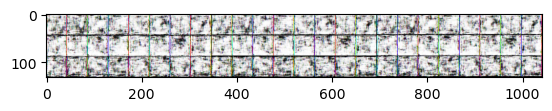

 27%|██▋       | 500/1875 [06:10<16:39,  1.38it/s, gp=0.173, loss_critic=-9.22]

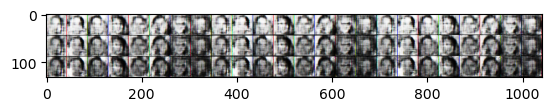

 53%|█████▎    | 1000/1875 [12:14<10:37,  1.37it/s, gp=0.146, loss_critic=-12.6]

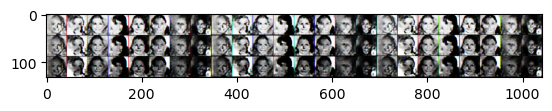

 80%|████████  | 1500/1875 [18:19<04:33,  1.37it/s, gp=0.0736, loss_critic=5.79]

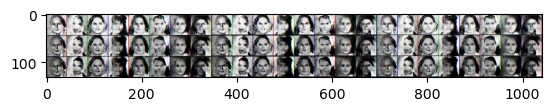

100%|██████████| 1875/1875 [22:53<00:00,  1.37it/s, gp=0.0773, loss_critic=-3.63]


=> Saving checkpoint
=> Saving checkpoint
Epoch [2/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

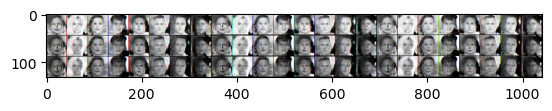

 27%|██▋       | 500/1875 [06:06<16:41,  1.37it/s, gp=0.0414, loss_critic=-3.38]

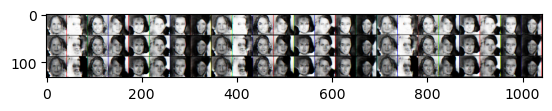

 53%|█████▎    | 1000/1875 [12:11<10:38,  1.37it/s, gp=0.0614, loss_critic=-5.72]

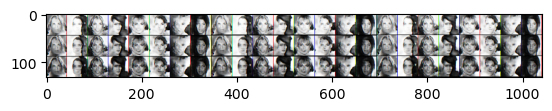

 80%|████████  | 1500/1875 [18:16<04:33,  1.37it/s, gp=0.0246, loss_critic=-4.48]

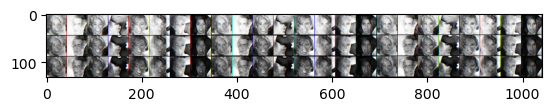

100%|██████████| 1875/1875 [22:50<00:00,  1.37it/s, gp=0.0522, loss_critic=-2.32]


=> Saving checkpoint
=> Saving checkpoint
Epoch [3/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

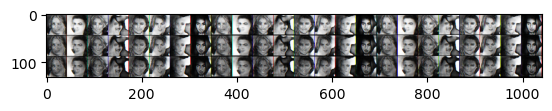

 27%|██▋       | 500/1875 [06:05<16:41,  1.37it/s, gp=0.0192, loss_critic=-4.14]

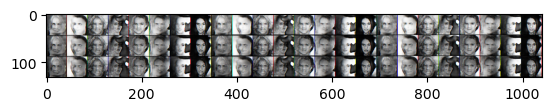

 53%|█████▎    | 1000/1875 [12:10<10:37,  1.37it/s, gp=0.0609, loss_critic=-1.29]

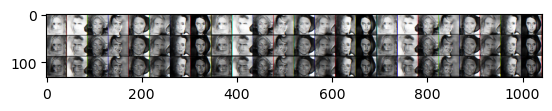

 80%|████████  | 1500/1875 [18:15<04:33,  1.37it/s, gp=0.00832, loss_critic=-2.74]

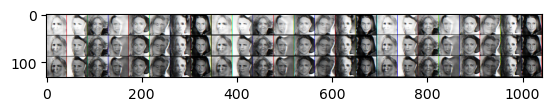

100%|██████████| 1875/1875 [22:48<00:00,  1.37it/s, gp=0.00885, loss_critic=-1.87]


=> Saving checkpoint
=> Saving checkpoint
Epoch [4/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

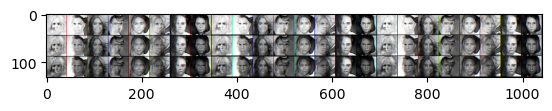

 27%|██▋       | 500/1875 [06:05<16:55,  1.35it/s, gp=0.0327, loss_critic=-2.89]

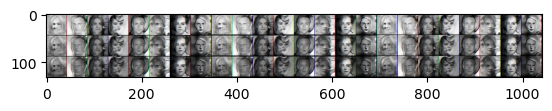

 53%|█████▎    | 1000/1875 [12:10<10:36,  1.37it/s, gp=0.0498, loss_critic=-3.36]

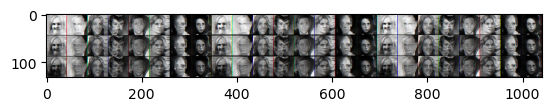

 80%|████████  | 1500/1875 [18:15<04:34,  1.36it/s, gp=0.0275, loss_critic=-3.21]

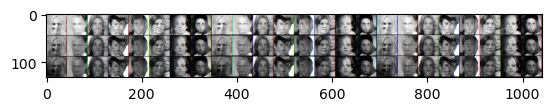

100%|██████████| 1875/1875 [22:49<00:00,  1.37it/s, gp=0.0628, loss_critic=-1.48]


=> Saving checkpoint
=> Saving checkpoint
Epoch [5/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

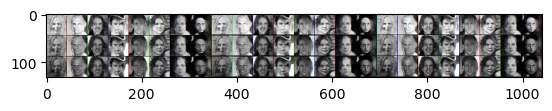

 27%|██▋       | 500/1875 [06:05<16:40,  1.37it/s, gp=0.0136, loss_critic=-1.79]

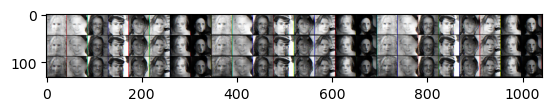

 53%|█████▎    | 1000/1875 [12:10<10:36,  1.38it/s, gp=0.0324, loss_critic=-3.71]

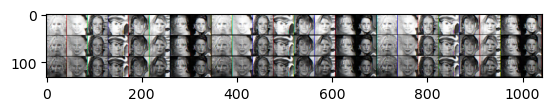

 80%|████████  | 1500/1875 [18:15<04:32,  1.38it/s, gp=0.0352, loss_critic=-3.33]

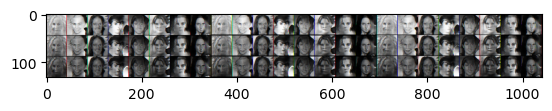

100%|██████████| 1875/1875 [22:49<00:00,  1.37it/s, gp=0.0175, loss_critic=-3.19]


=> Saving checkpoint
=> Saving checkpoint
Epoch [6/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

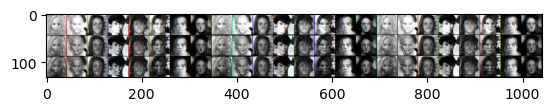

 27%|██▋       | 500/1875 [06:06<16:41,  1.37it/s, gp=0.00655, loss_critic=-2.39]

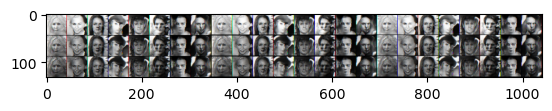

 53%|█████▎    | 1000/1875 [12:11<10:39,  1.37it/s, gp=0.028, loss_critic=-.54]

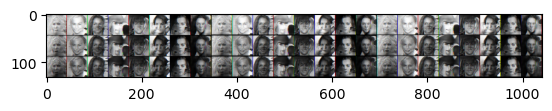

 80%|████████  | 1500/1875 [18:16<04:32,  1.37it/s, gp=0.026, loss_critic=-.926]

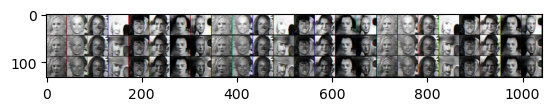

100%|██████████| 1875/1875 [22:50<00:00,  1.37it/s, gp=0.00769, loss_critic=-2.08]


=> Saving checkpoint
=> Saving checkpoint
Epoch [7/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

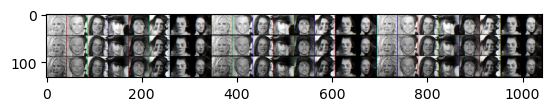

 27%|██▋       | 500/1875 [06:06<16:43,  1.37it/s, gp=0.0147, loss_critic=-2.25]

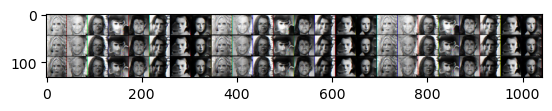

 53%|█████▎    | 1000/1875 [12:10<10:36,  1.38it/s, gp=0.0196, loss_critic=-2.98]

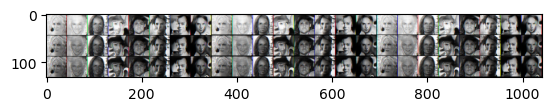

 80%|████████  | 1500/1875 [18:15<04:32,  1.37it/s, gp=0.0257, loss_critic=-4.07]

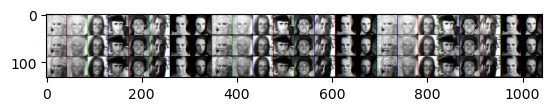

100%|██████████| 1875/1875 [22:49<00:00,  1.37it/s, gp=0.0107, loss_critic=-1.47]


=> Saving checkpoint
=> Saving checkpoint
Epoch [8/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

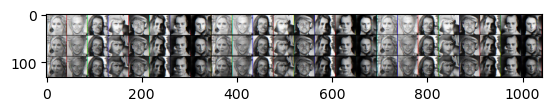

 27%|██▋       | 500/1875 [06:05<16:44,  1.37it/s, gp=0.0309, loss_critic=-1.11]

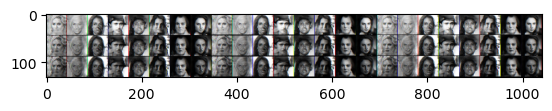

 53%|█████▎    | 1000/1875 [12:10<10:36,  1.38it/s, gp=0.0146, loss_critic=-.748]

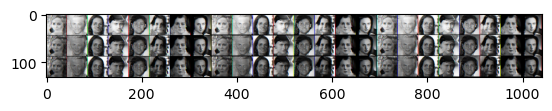

 80%|████████  | 1500/1875 [18:14<04:33,  1.37it/s, gp=0.0162, loss_critic=-.653]

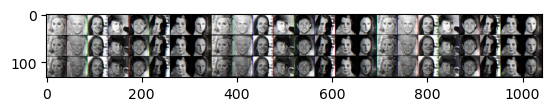

100%|██████████| 1875/1875 [22:48<00:00,  1.37it/s, gp=0.0201, loss_critic=-2.62]


=> Saving checkpoint
=> Saving checkpoint
Epoch [9/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

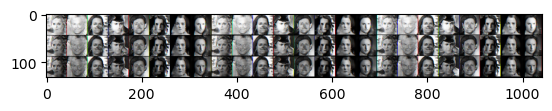

 27%|██▋       | 500/1875 [06:05<16:41,  1.37it/s, gp=0.00645, loss_critic=-2.43]

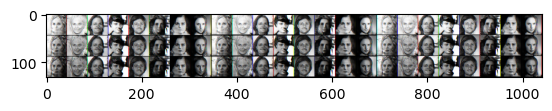

 53%|█████▎    | 1000/1875 [12:10<10:36,  1.37it/s, gp=0.00729, loss_critic=-1.98]

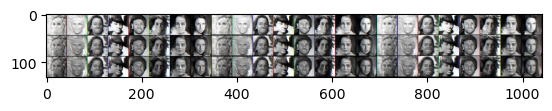

 80%|████████  | 1500/1875 [18:14<04:32,  1.38it/s, gp=0.0202, loss_critic=-.637]

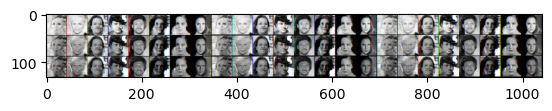

100%|██████████| 1875/1875 [22:48<00:00,  1.37it/s, gp=0.0136, loss_critic=-3.85]


=> Saving checkpoint
=> Saving checkpoint
Epoch [10/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

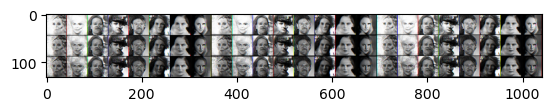

 27%|██▋       | 500/1875 [06:05<16:40,  1.37it/s, gp=0.0256, loss_critic=-5.38]

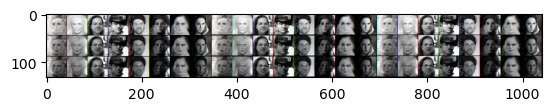

 53%|█████▎    | 1000/1875 [12:10<10:36,  1.37it/s, gp=0.0158, loss_critic=-1.78]

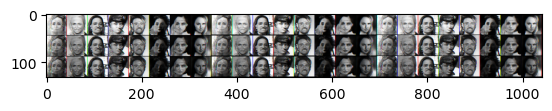

 80%|████████  | 1500/1875 [18:15<04:33,  1.37it/s, gp=0.00461, loss_critic=-1.98]

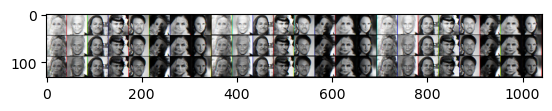

100%|██████████| 1875/1875 [22:50<00:00,  1.37it/s, gp=0.0231, loss_critic=2.26]


=> Saving checkpoint
=> Saving checkpoint
Epoch [11/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

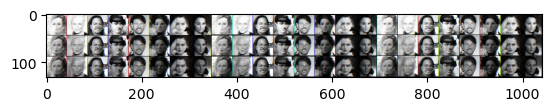

 27%|██▋       | 500/1875 [06:06<16:40,  1.37it/s, gp=0.0172, loss_critic=-.417]

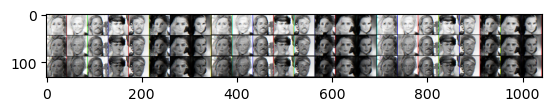

 53%|█████▎    | 1000/1875 [12:11<10:37,  1.37it/s, gp=0.0363, loss_critic=-1]

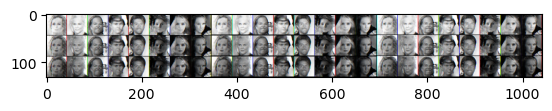

 80%|████████  | 1500/1875 [18:16<04:32,  1.38it/s, gp=0.0147, loss_critic=-.528]

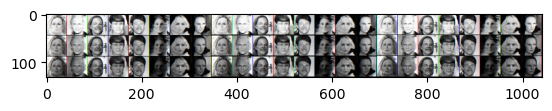

100%|██████████| 1875/1875 [22:50<00:00,  1.37it/s, gp=0.0246, loss_critic=-.994]


=> Saving checkpoint
=> Saving checkpoint
Epoch [12/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

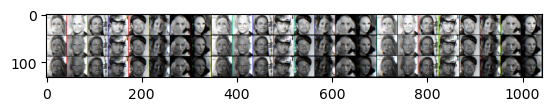

 27%|██▋       | 500/1875 [06:06<16:44,  1.37it/s, gp=0.0184, loss_critic=-1.4]

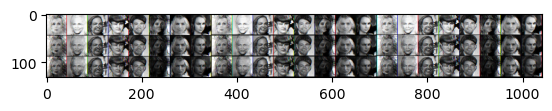

 53%|█████▎    | 1000/1875 [12:11<10:39,  1.37it/s, gp=0.0145, loss_critic=-.771]

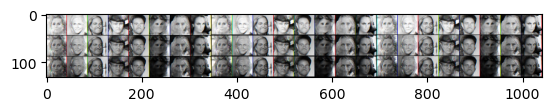

 80%|████████  | 1500/1875 [18:16<04:34,  1.37it/s, gp=0.00451, loss_critic=-1.59]

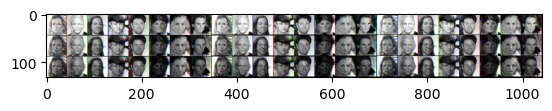

100%|██████████| 1875/1875 [22:51<00:00,  1.37it/s, gp=0.00993, loss_critic=0.496]


=> Saving checkpoint
=> Saving checkpoint
Epoch [13/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

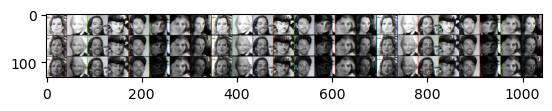

 27%|██▋       | 500/1875 [06:06<16:41,  1.37it/s, gp=0.0137, loss_critic=-2.08]

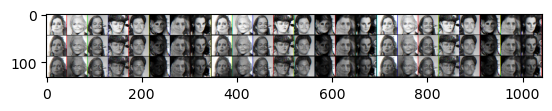

 53%|█████▎    | 1000/1875 [12:11<10:36,  1.37it/s, gp=0.00548, loss_critic=-2.28]

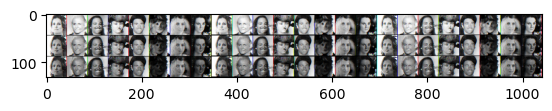

 80%|████████  | 1500/1875 [18:16<04:36,  1.36it/s, gp=0.00468, loss_critic=-3.12]

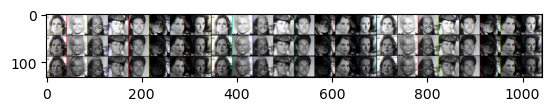

100%|██████████| 1875/1875 [22:50<00:00,  1.37it/s, gp=0.0119, loss_critic=-1.15]


=> Saving checkpoint
=> Saving checkpoint
Epoch [14/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

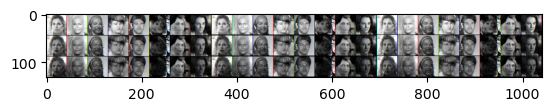

 27%|██▋       | 500/1875 [06:06<16:42,  1.37it/s, gp=0.0129, loss_critic=-.0239]

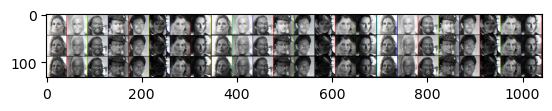

 53%|█████▎    | 1000/1875 [12:11<10:40,  1.37it/s, gp=0.0412, loss_critic=-.917]

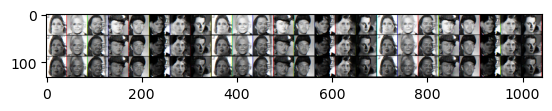

 80%|████████  | 1500/1875 [18:17<04:32,  1.37it/s, gp=0.0143, loss_critic=-2.25]

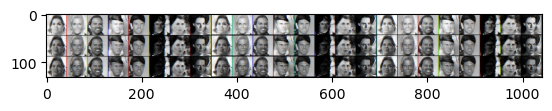

100%|██████████| 1875/1875 [22:51<00:00,  1.37it/s, gp=0.0286, loss_critic=-.232]


=> Saving checkpoint
=> Saving checkpoint
Epoch [15/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

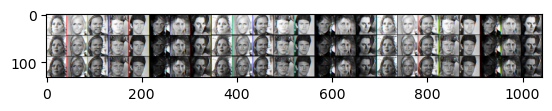

 27%|██▋       | 500/1875 [06:06<16:41,  1.37it/s, gp=0.0236, loss_critic=-2.23]

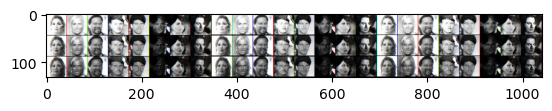

 53%|█████▎    | 1000/1875 [12:12<10:38,  1.37it/s, gp=0.0059, loss_critic=-3.15]

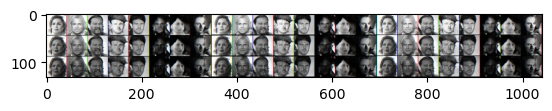

 80%|████████  | 1500/1875 [18:17<04:33,  1.37it/s, gp=0.0129, loss_critic=-1.76]

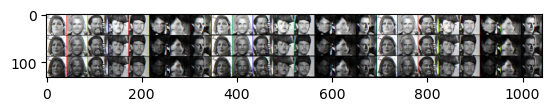

100%|██████████| 1875/1875 [22:51<00:00,  1.37it/s, gp=0.0103, loss_critic=-1.28]


=> Saving checkpoint
=> Saving checkpoint
Epoch [16/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

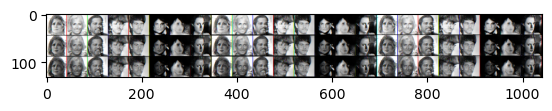

 27%|██▋       | 500/1875 [06:06<16:40,  1.37it/s, gp=0.00657, loss_critic=-1.85]

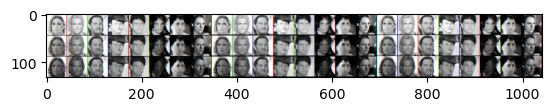

 53%|█████▎    | 1000/1875 [12:11<10:38,  1.37it/s, gp=0.00711, loss_critic=-2.34]

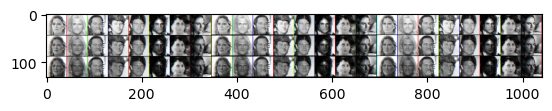

 80%|████████  | 1500/1875 [18:17<04:39,  1.34it/s, gp=0.00373, loss_critic=-1.48]

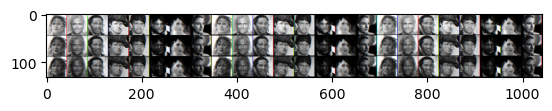

100%|██████████| 1875/1875 [22:51<00:00,  1.37it/s, gp=0.00701, loss_critic=-1.49]


=> Saving checkpoint
=> Saving checkpoint
Epoch [17/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

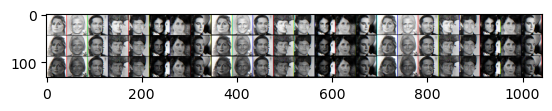

 27%|██▋       | 500/1875 [06:06<16:42,  1.37it/s, gp=0.0192, loss_critic=-1.61]

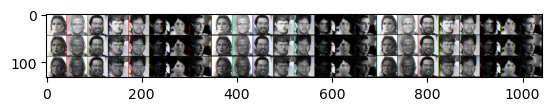

 53%|█████▎    | 1000/1875 [12:11<10:36,  1.37it/s, gp=0.00521, loss_critic=-1.64]

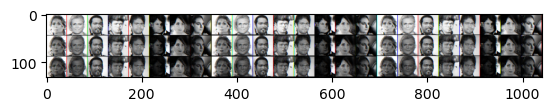

 80%|████████  | 1500/1875 [18:17<04:33,  1.37it/s, gp=0.009, loss_critic=-2.57]

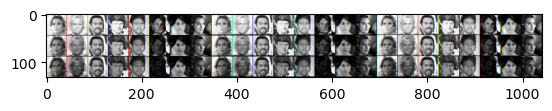

100%|██████████| 1875/1875 [22:50<00:00,  1.37it/s, gp=0.0168, loss_critic=-.664]


=> Saving checkpoint
=> Saving checkpoint
Epoch [18/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

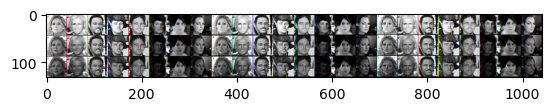

 27%|██▋       | 500/1875 [06:06<16:42,  1.37it/s, gp=0.0112, loss_critic=-.715]

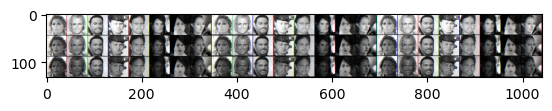

 53%|█████▎    | 1000/1875 [12:11<10:38,  1.37it/s, gp=0.00597, loss_critic=-1.41]

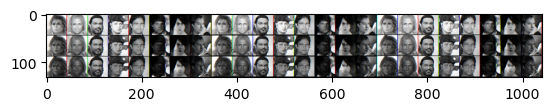

 80%|████████  | 1500/1875 [18:16<04:32,  1.38it/s, gp=0.00565, loss_critic=-1.69]

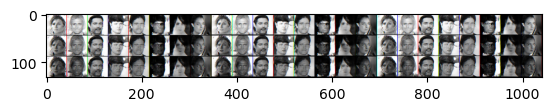

100%|██████████| 1875/1875 [22:50<00:00,  1.37it/s, gp=0.00514, loss_critic=-1.42]


=> Saving checkpoint
=> Saving checkpoint
Epoch [19/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

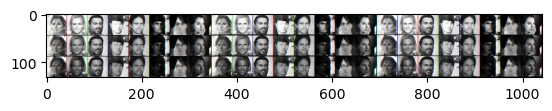

 27%|██▋       | 500/1875 [06:06<16:40,  1.37it/s, gp=0.012, loss_critic=-2.59]

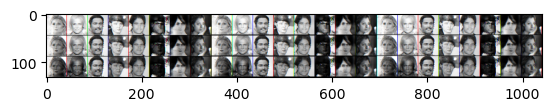

 53%|█████▎    | 1000/1875 [12:11<10:37,  1.37it/s, gp=0.00984, loss_critic=-1.25]

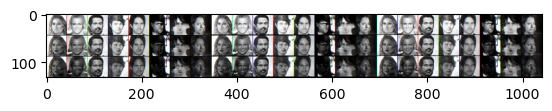

 80%|████████  | 1500/1875 [18:16<04:36,  1.36it/s, gp=0.0123, loss_critic=-1.22]

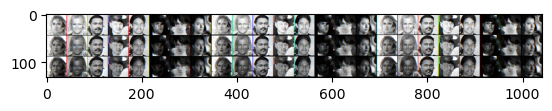

100%|██████████| 1875/1875 [22:50<00:00,  1.37it/s, gp=0.013, loss_critic=-1.87]


=> Saving checkpoint
=> Saving checkpoint
Epoch [20/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

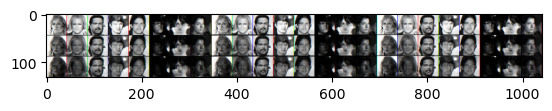

 27%|██▋       | 500/1875 [06:06<16:44,  1.37it/s, gp=0.00323, loss_critic=-2.01]

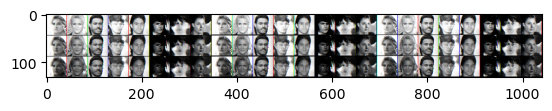

 53%|█████▎    | 1000/1875 [12:11<10:36,  1.37it/s, gp=0.0194, loss_critic=-2.17]

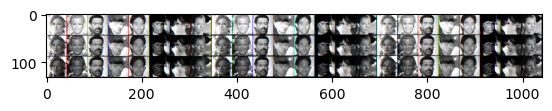

 80%|████████  | 1500/1875 [18:17<04:33,  1.37it/s, gp=0.0143, loss_critic=-1.07]

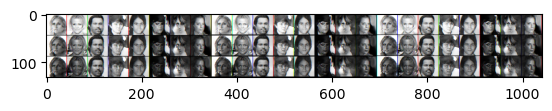

100%|██████████| 1875/1875 [22:51<00:00,  1.37it/s, gp=0.00831, loss_critic=0.298]


=> Saving checkpoint
=> Saving checkpoint
Epoch [21/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

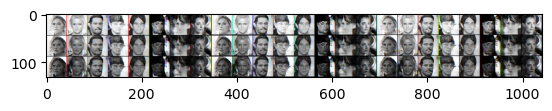

 27%|██▋       | 500/1875 [06:07<16:41,  1.37it/s, gp=0.005, loss_critic=-2.59]

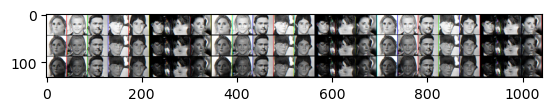

 53%|█████▎    | 1000/1875 [12:13<10:39,  1.37it/s, gp=0.00608, loss_critic=-1.26]

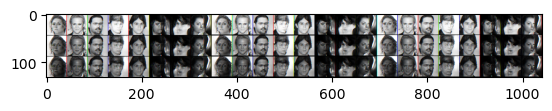

 80%|████████  | 1500/1875 [18:19<04:33,  1.37it/s, gp=0.0139, loss_critic=-3.46]

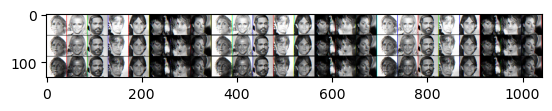

100%|██████████| 1875/1875 [22:54<00:00,  1.36it/s, gp=0.00912, loss_critic=-1.23]


=> Saving checkpoint
=> Saving checkpoint
Epoch [22/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

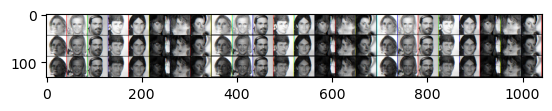

 27%|██▋       | 500/1875 [06:07<16:42,  1.37it/s, gp=0.00683, loss_critic=-1.06]

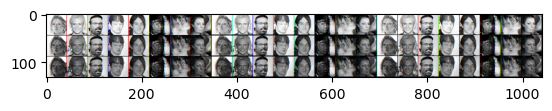

 53%|█████▎    | 1000/1875 [12:13<10:37,  1.37it/s, gp=0.0128, loss_critic=-1.22]

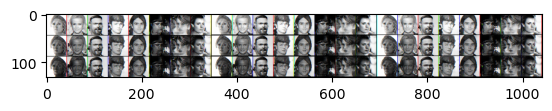

 80%|████████  | 1500/1875 [18:20<04:33,  1.37it/s, gp=0.00351, loss_critic=-2.18]

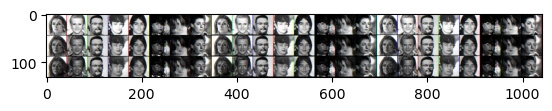

100%|██████████| 1875/1875 [22:55<00:00,  1.36it/s, gp=0.00339, loss_critic=-1.02]


=> Saving checkpoint
=> Saving checkpoint
Epoch [23/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

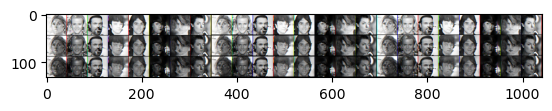

 27%|██▋       | 500/1875 [06:08<16:52,  1.36it/s, gp=0.0083, loss_critic=-.311]

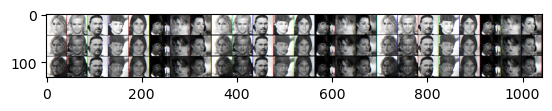

 53%|█████▎    | 1000/1875 [12:14<10:42,  1.36it/s, gp=0.0113, loss_critic=-1.62]

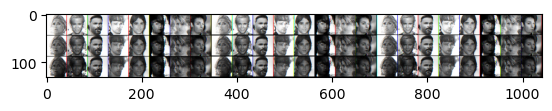

 80%|████████  | 1500/1875 [18:21<04:33,  1.37it/s, gp=0.00698, loss_critic=-1.31]

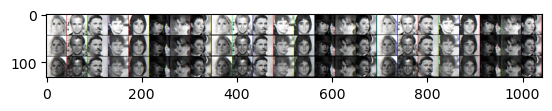

100%|██████████| 1875/1875 [22:55<00:00,  1.36it/s, gp=0.0129, loss_critic=0.0435]


=> Saving checkpoint
=> Saving checkpoint
Epoch [24/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

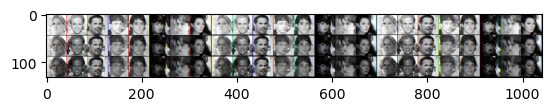

 27%|██▋       | 500/1875 [06:06<16:44,  1.37it/s, gp=0.0221, loss_critic=-3.7]

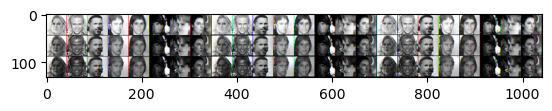

 53%|█████▎    | 1000/1875 [12:12<10:37,  1.37it/s, gp=0.0139, loss_critic=-1.19]

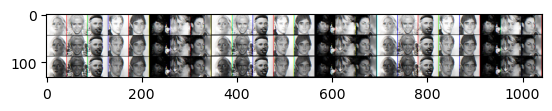

 80%|████████  | 1500/1875 [18:17<04:33,  1.37it/s, gp=0.00367, loss_critic=-1.26]

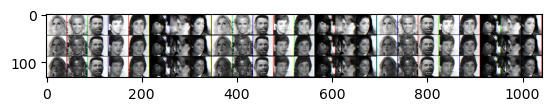

100%|██████████| 1875/1875 [22:51<00:00,  1.37it/s, gp=0.0102, loss_critic=-2.76]


=> Saving checkpoint
=> Saving checkpoint
Epoch [25/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

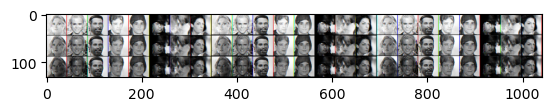

 27%|██▋       | 500/1875 [06:06<16:43,  1.37it/s, gp=0.0105, loss_critic=-.0508]

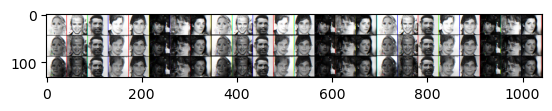

 53%|█████▎    | 1000/1875 [12:12<10:38,  1.37it/s, gp=0.00321, loss_critic=-1.71]

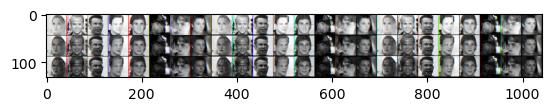

 80%|████████  | 1500/1875 [18:17<04:33,  1.37it/s, gp=0.00366, loss_critic=-2.02]

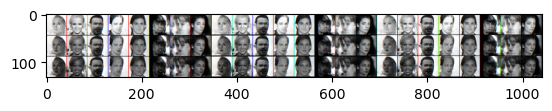

100%|██████████| 1875/1875 [22:52<00:00,  1.37it/s, gp=0.00653, loss_critic=-2.8]


=> Saving checkpoint
=> Saving checkpoint
Epoch [26/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

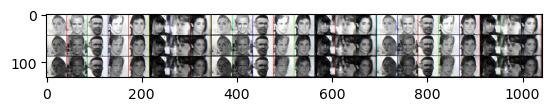

 27%|██▋       | 500/1875 [06:07<16:43,  1.37it/s, gp=0.0217, loss_critic=-.934]

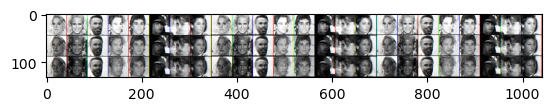

 53%|█████▎    | 1000/1875 [12:12<10:53,  1.34it/s, gp=0.00727, loss_critic=-.391]

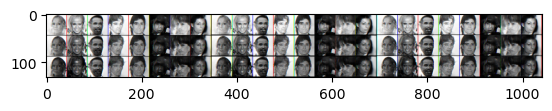

 80%|████████  | 1500/1875 [18:18<04:33,  1.37it/s, gp=0.00404, loss_critic=-1.66]

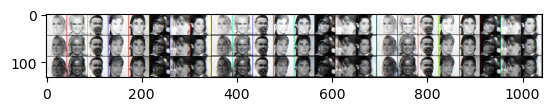

100%|██████████| 1875/1875 [22:53<00:00,  1.36it/s, gp=0.0163, loss_critic=-1.07]


=> Saving checkpoint
=> Saving checkpoint
Epoch [27/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

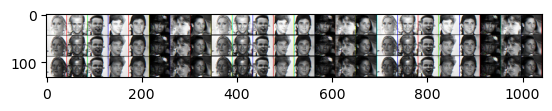

 27%|██▋       | 500/1875 [06:07<16:43,  1.37it/s, gp=0.00885, loss_critic=0.724]

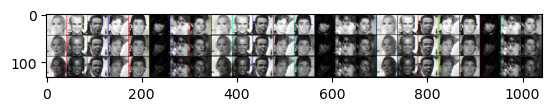

 53%|█████▎    | 1000/1875 [12:13<10:45,  1.36it/s, gp=0.00573, loss_critic=-1.83]

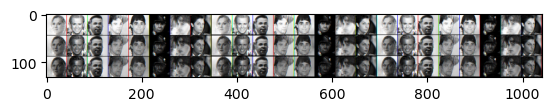

 80%|████████  | 1500/1875 [18:18<04:33,  1.37it/s, gp=0.00834, loss_critic=-1.23]

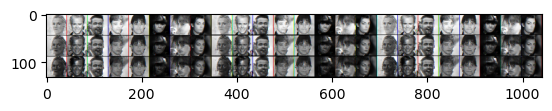

100%|██████████| 1875/1875 [22:53<00:00,  1.37it/s, gp=0.00812, loss_critic=-1.15]


=> Saving checkpoint
=> Saving checkpoint
Epoch [28/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

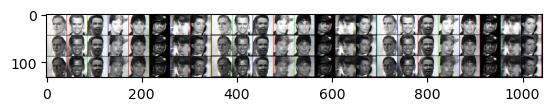

 27%|██▋       | 500/1875 [06:07<16:41,  1.37it/s, gp=0.00124, loss_critic=-2.63]

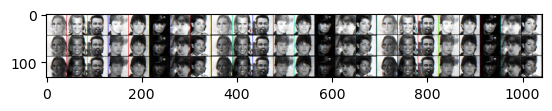

 53%|█████▎    | 1000/1875 [12:13<10:40,  1.37it/s, gp=0.0113, loss_critic=-1.1]

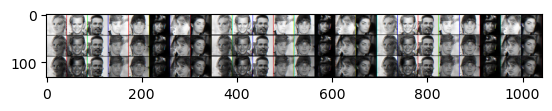

 80%|████████  | 1500/1875 [18:19<04:33,  1.37it/s, gp=0.0165, loss_critic=-.886]

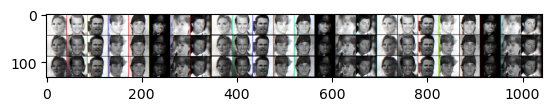

100%|██████████| 1875/1875 [22:53<00:00,  1.36it/s, gp=0.00981, loss_critic=-1.86]


=> Saving checkpoint
=> Saving checkpoint
Epoch [29/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

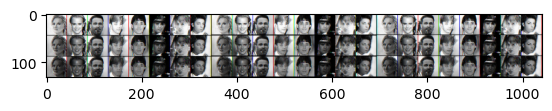

 27%|██▋       | 500/1875 [06:07<16:47,  1.37it/s, gp=0.0167, loss_critic=-1.22]

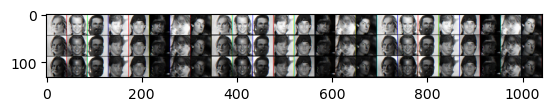

 53%|█████▎    | 1000/1875 [12:13<10:42,  1.36it/s, gp=0.0119, loss_critic=-1.13]

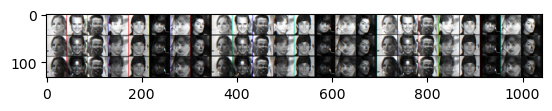

 80%|████████  | 1500/1875 [18:19<04:34,  1.37it/s, gp=0.00399, loss_critic=-1.16]

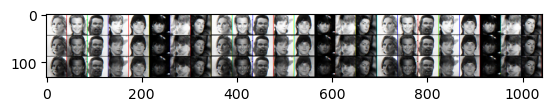

100%|██████████| 1875/1875 [22:54<00:00,  1.36it/s, gp=0.029, loss_critic=1.12]


=> Saving checkpoint
=> Saving checkpoint
Epoch [30/30]


  0%|          | 0/1875 [00:00<?, ?it/s]

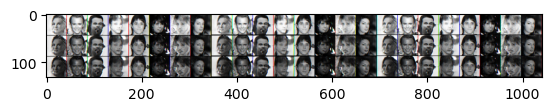

 27%|██▋       | 500/1875 [06:07<16:42,  1.37it/s, gp=0.00714, loss_critic=-1.65]

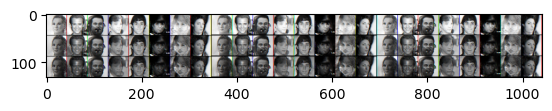

 53%|█████▎    | 1000/1875 [12:13<10:41,  1.36it/s, gp=0.00566, loss_critic=-2.33]

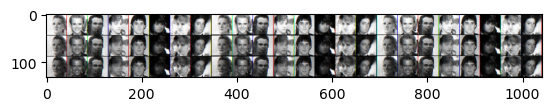

 80%|████████  | 1500/1875 [18:19<04:33,  1.37it/s, gp=0.012, loss_critic=-1.65]

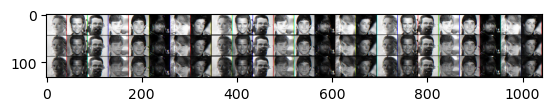

100%|██████████| 1875/1875 [22:54<00:00,  1.36it/s, gp=0.0161, loss_critic=0.218]


=> Saving checkpoint
=> Saving checkpoint
Current image size: 256
Epoch [1/30]


  0%|          | 0/1875 [00:03<?, ?it/s]


RuntimeError: shape '[132, 1042, 3]' is invalid for input of size 1611480

In [19]:
main()